# Load Graph

In [8]:
import graph_tool.all as gt
import numpy as np

In [111]:
# Load the graph
g = gt.load_graph("multilayer_network_graph_new.gt")
# figure path
figure_path = "/Users/jiashichao/Desktop/Edinburgh/valerio_project/evaluation_figures/"

In [10]:
# Print all vertex and edge properties
print("Vertex properties:")
for prop in g.vertex_properties.keys():
    print(prop)

print("\nEdge properties:")
for prop in g.edge_properties.keys():
    print(prop)

Vertex properties:
name
kind
vlayers

Edge properties:
edgeCount
edgeType


# Basic Graph Statistics

In [11]:
# Print some basic graph statistics
print(f"Number of vertices: {g.num_vertices()}")
print(f"Number of edges: {g.num_edges()}")

# Get the vertex and edge properties
vertex_types = g.vertex_properties["kind"]
vertex_layer = g.vertex_properties["vlayers"]
edge_types = g.edge_properties["edgeType"]

# Count the number of each type of vertex
id_vertices = sum(1 for v in g.vertices() if vertex_types[v] == 0)
bank_vertices = sum(1 for v in g.vertices() if vertex_types[v] == 1)
city_vertices = sum(1 for v in g.vertices() if vertex_types[v] == 2)

# Print the counts
print(f"Number of ID vertices: {id_vertices}")
print(f"Number of bank vertices: {bank_vertices}")
print(f"Number of city vertices: {city_vertices}")

# Count the number of each type of edge
id_bank_edges = sum(1 for e in g.edges() if edge_types[e] == 1)
id_city_edges = sum(1 for e in g.edges() if edge_types[e] == 0)

# Print the counts
print(f"Number of ID-bank edges: {id_bank_edges}")
print(f"Number of ID-city edges: {id_city_edges}")

Number of vertices: 3846
Number of edges: 8995
Number of ID vertices: 3283
Number of bank vertices: 32
Number of city vertices: 531
Number of ID-bank edges: 5712
Number of ID-city edges: 3283


# Degree Distribution

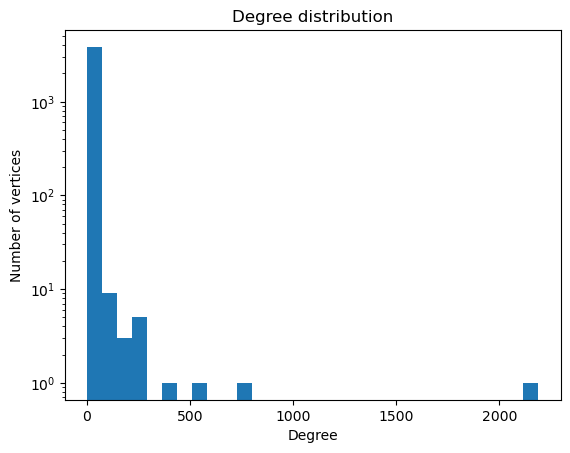

In [12]:
import matplotlib.pyplot as plt
# Calculate the degree of each vertex
degrees = g.get_total_degrees(g.get_vertices())
# Plot the degree distribution
plt.hist(degrees, bins=30, log=True)
plt.xlabel('Degree')
plt.ylabel('Number of vertices')
plt.title('Degree distribution')
plt.savefig(figure_path+"degree_distribution.png")
plt.show()

In [13]:
# Find the vertex with the maximum degree
max_degree_vertex = g.vertex(np.argmax(degrees))

# Print the vertex and its degree vertex_types = g.vertex_properties["kind"]
print(f"Vertex with the maximum degree: {degrees[np.argmax(degrees)]}")
vertex_names = g.vertex_properties["name"]
print(f"Vertex is: {vertex_names[max_degree_vertex]}")

Vertex with the maximum degree: 2188
Vertex is: HSBC BANK PLC


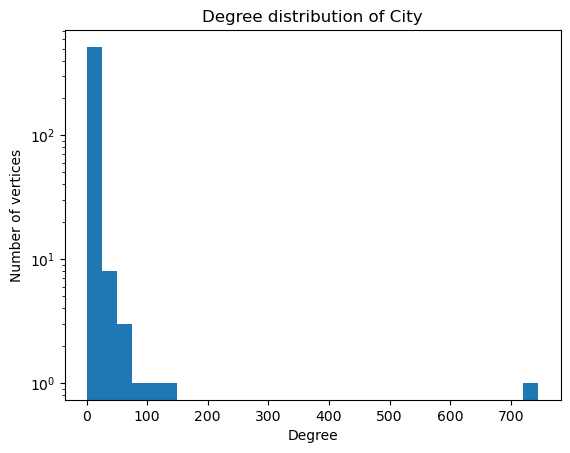

In [14]:
# Calculate the degree of city vertex
city_vertex = [v for v in g.vertices() if vertex_types[v] == 2]
city_degrees = g.get_total_degrees(city_vertex)
# Plot the degree distribution
plt.hist(city_degrees, bins=30, log=True)
plt.xlabel('Degree')
plt.ylabel('Number of vertices')
plt.title('Degree distribution of City')
plt.savefig(figure_path+"degree_distribution_city")
plt.show()

In [15]:
# Find the vertex with the maximum degree
max_degree_vertex = city_vertex[np.argmax(city_degrees)]

# Print the vertex and its degree vertex_types = g.vertex_properties["kind"]
print(f"Vertex with the maximum degree: {city_degrees[np.argmax(city_degrees)]}")
print(f"Vertex is: {vertex_names[max_degree_vertex]}")

Vertex with the maximum degree: 745
Vertex is: London


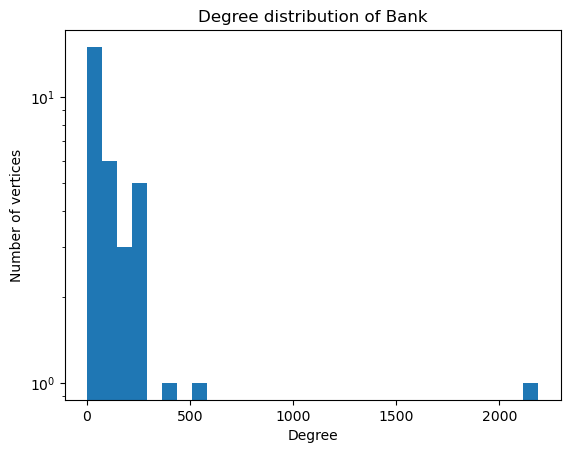

In [16]:
# Calculate the degree of bank vertex
bank_vertex = [v for v in g.vertices() if vertex_types[v] == 1]
bank_degrees = g.get_total_degrees(bank_vertex)
# Plot the degree distribution
plt.hist(bank_degrees, bins=30, log=True)
plt.xlabel('Degree')
plt.ylabel('Number of vertices')
plt.title('Degree distribution of Bank')
plt.savefig(figure_path+"degree_distribution_bank")
plt.show()

In [17]:
# Find the vertex with the maximum degree
max_degree_vertex = bank_vertex[np.argmax(bank_degrees)]

# Print the vertex and its degree vertex_types = g.vertex_properties["kind"]
print(f"Vertex with the maximum degree: {bank_degrees[np.argmax(bank_degrees)]}")
print(f"Vertex is: {vertex_names[max_degree_vertex]}")

Vertex with the maximum degree: 2188
Vertex is: HSBC BANK PLC


# clustering coefficient
因为没有闭合的三角形，所以都是0

In [18]:
# Calculate local clustering coefficient for each vertex
clustering_coeffs = gt.local_clustering(g)

# If you want the average clustering coefficient for the entire graph
avg_clustering_coeff = clustering_coeffs.fa.mean()

print(f"Average Clustering Coefficient: {avg_clustering_coeff}")

Average Clustering Coefficient: 0.0


# Edge Weight

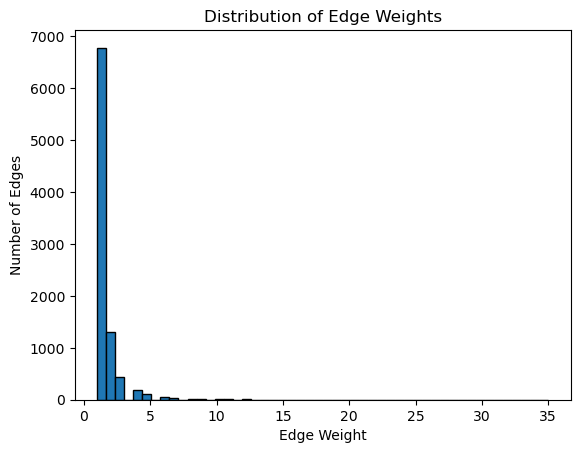

In [19]:
edge_weight = g.ep["edgeCount"]
# Plotting the histogram
plt.hist(edge_weight.a, bins=50, edgecolor='black')
plt.title("Distribution of Edge Weights")
plt.xlabel("Edge Weight")
plt.ylabel("Number of Edges")
plt.savefig(figure_path+"edge_weights.png")
plt.show()

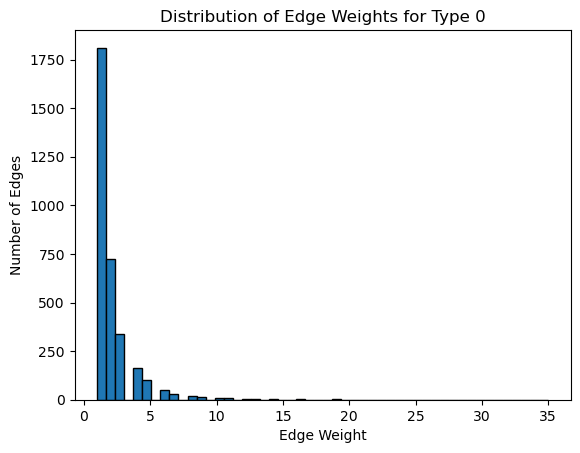

For edge type 0:
The edge with the maximum weight is between vertex 5ca60378-6054-4a23-8f02-24748c658b16 and vertex London.
Edge weight: 35



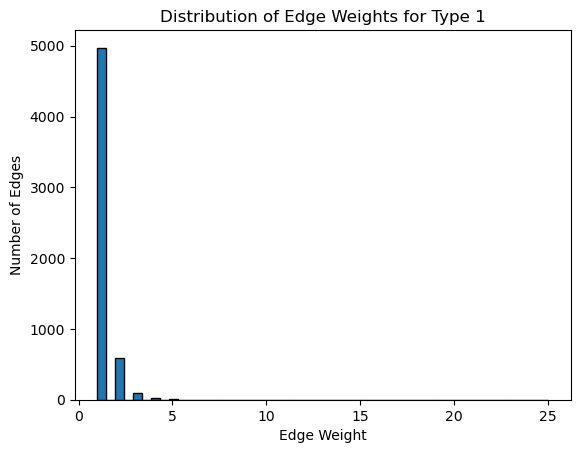

For edge type 1:
The edge with the maximum weight is between vertex 5ca60378-6054-4a23-8f02-24748c658b16 and vertex VANQUIS BANK.
Edge weight: 25



In [20]:
edge_types = g.ep["edgeType"]
# Separate edges based on their type
edge_types_dict = {}
for e in g.edges():
    edge_type = edge_types[e]
    if edge_type not in edge_types_dict:
        edge_types_dict[edge_type] = []
    edge_types_dict[edge_type].append(e)
# For each edge type, plot the weight distribution and find the edge with the maximum weight
for edge_type, edges in edge_types_dict.items():
    weights = [edge_weight[e] for e in edges]
    
    # Plotting the histogram
    plt.figure()
    plt.hist(weights, bins=50, edgecolor='black')
    plt.title(f"Distribution of Edge Weights for Type {edge_type}")
    plt.xlabel("Edge Weight")
    plt.ylabel("Number of Edges")
    plt.savefig(figure_path+f"edge_weights_{edge_type}.png")
    plt.show()
    
    # Find the edge with the maximum weight for this type
    max_weight_edge = max(edges, key=lambda e: edge_weight[e])
    source_vertex = max_weight_edge.source()
    target_vertex = max_weight_edge.target()
    
    print(f"For edge type {edge_type}:")
    print(f"The edge with the maximum weight is between vertex {vertex_names[source_vertex]} and vertex {vertex_names[target_vertex]}.")
    print(f"Edge weight: {edge_weight[max_weight_edge]}\n")

# Community Detection

Number of communities: 5
<VertexPropertyMap object with value type 'int32_t', for Graph 0x297cd0d50, at 0x298d07790>
Vertex 0 is in community 492
Vertex 1 is in community 3818
Vertex 2 is in community 492
Vertex 3 is in community 3818
Vertex 4 is in community 492
Vertex 5 is in community 492
Vertex 6 is in community 132
Vertex 7 is in community 170
Vertex 8 is in community 3818
Vertex 9 is in community 492
Vertex 10 is in community 3818
Vertex 11 is in community 492
Vertex 12 is in community 3818
Vertex 13 is in community 170
Vertex 14 is in community 170
Vertex 15 is in community 3818
Vertex 16 is in community 492
Vertex 17 is in community 3818
Vertex 18 is in community 492
Vertex 19 is in community 3818
Vertex 20 is in community 492
Vertex 21 is in community 492
Vertex 22 is in community 3818
Vertex 23 is in community 492
Vertex 24 is in community 3818
Vertex 25 is in community 492
Vertex 26 is in community 3818
Vertex 27 is in community 170
Vertex 28 is in community 3818
Vertex 29 i

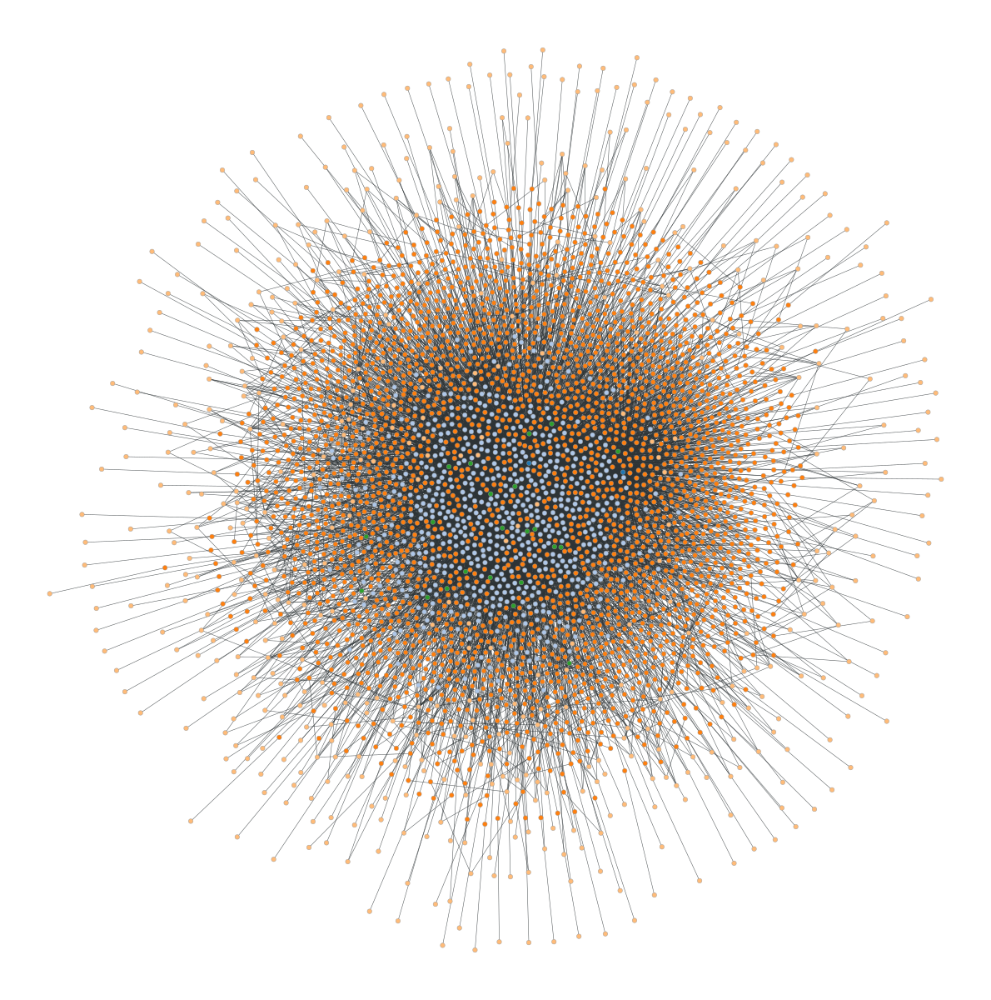

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x297cd0d50, at 0x297c15b50>

In [114]:
# Perform community detection
state = gt.minimize_blockmodel_dl(g, )

# Print the number of communities
print(f"Number of communities: {len(set(state.get_blocks()))}")
print(state.get_blocks())

# You can also print the community of each vertex
for v in g.iter_vertices():
    print(f"Vertex {v} is in community {state.get_blocks()[v]}")

# To visualize the communities, you can color the vertices according to their community
g.vertex_properties["community"] = state.get_blocks()
gt.graph_draw(g, vertex_fill_color=g.vertex_properties["community"])

In [117]:
# Get block labels for each vertex
blocks = state.get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(vertex_names[v])

# Print out the vertices for each community
for block, vertices in community_dict.items():
    print(f"Community {block}:")
    vertex_list = ", ".join([str(v) for v in vertices])
    print(vertex_list)
    print(f"Total Nodes in this Community is: {len(vertex_list.split(','))}")
    print(f"Total Nodes in Whole Network: {len(g.get_vertices())}")
    print("----------------------")

Community 492:
ce3d4f74-f5ea-4d78-8ba8-ceca45235edb, ffcf3506-a7d8-48a0-ba54-d4d54d15ee78, 2aa2a980-470d-470a-8379-ec51e5036ee4, 749ca4ea-26cb-4163-83f1-f5a2fca3a16a, c0cdb5dc-ac39-4265-b66a-51faf326aed8, 6dec603a-b53c-4ca2-8c00-88f120d926f8, 83e821ec-6421-41cd-ad77-7921d11aad4d, 4713364b-17cb-4e9a-ac84-3be210e697a7, 22c9479f-0bc5-4210-abbd-6fe60e831138, bcb82538-178f-40d4-9559-bc750247fb2a, 3c629f00-e63d-4a51-87b0-85e207ee56e1, 09de4854-67ae-46d1-9a06-b72d64ffaa32, 8c3b9ab4-f433-4ad7-a879-5d4e805fd1a9, a003a2d3-8379-4cab-82b2-3a4001fbc83f, bd0a63d4-657d-4863-9529-a0829cb8a2aa, f500ad81-912f-4770-bd1d-57b75decddfa, 84caeb81-d8be-45f9-8093-822b9fcfdcf0, 6921651e-69f1-4e83-b65c-99cdbf4a07bb, cb737080-1b02-43c5-9623-67da9f54a512, 0c922076-e434-411a-8a3e-1c06b00979f4, 9ff8a36b-f041-4648-8cc5-4bab6f3211ce, d86f2ff8-3008-434a-ae44-9b70a52f63eb, 21e6503a-8e75-400d-82bf-88c9ded1942b, 0991f6fb-c556-4198-905b-891a47992789, 290e6fa4-fd83-4cc4-ac08-90365a454330, 12a48873-b2af-4a43-817c-b766293d856

In [116]:
state.draw(output=figure_path+"simple_cd.png")

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x297cd0d50, at 0x28ceead90>

In [133]:
# Perform community detection
state = gt.minimize_nested_blockmodel_dl(g)

# Get the levels of the hierarchy
levels = state.get_levels()

# Print the number of communities at each level
for i, s in enumerate(levels):
    print(f"Level {i}: {len(set(s.get_blocks()))} communities")

# You can also print the community of each vertex at each level
for v in g.iter_vertices():
    communities = [s.get_blocks()[v] for s in levels]
    print(f"Vertex {v} is in communities {communities}")



Level 0: 5 communities
Level 1: 2 communities
Level 2: 1 communities
Level 3: 1 communities
Level 4: 1 communities
Level 5: 1 communities
Level 6: 1 communities
Level 7: 1 communities
Level 8: 1 communities
Level 9: 1 communities
Level 10: 1 communities
Level 11: 1 communities
Level 12: 1 communities
Vertex 0 is in communities [2858, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 1 is in communities [3818, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 2 is in communities [2858, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 3 is in communities [3818, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 4 is in communities [2858, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 5 is in communities [3591, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 6 is in communities [168, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 7 is in communities [2858, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 8 is in communities [3818, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 9 is in communities [3591, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [143]:
state.draw(output=figure_path+"nested_cd.png")

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x28d060c10>,
 <GraphView object, directed, with 3854 vertices and 3853 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2e67cca50, at 0x297bcd190>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2e67cca50, at 0x2f0746250>, False), at 0x2e67cca50>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2e67cca50, at 0x2e67cfe50>)

In [142]:
# Get block labels for each vertex
blocks = levels[0].get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(vertex_names[v])

# Print out the vertices for each community
for block, vertices in community_dict.items():
    print(f"Community {block}:")
    vertex_list = ", ".join([str(v) for v in vertices])
    print(vertex_list)
    print(f"Total Nodes in this Community is: {len(vertex_list.split(','))}")
    print(f"Total Nodes in Whole Network: {len(g.get_vertices())}")
    print("----------------------")

Community 2858:
ce3d4f74-f5ea-4d78-8ba8-ceca45235edb, ffcf3506-a7d8-48a0-ba54-d4d54d15ee78, 2aa2a980-470d-470a-8379-ec51e5036ee4, 3253926e-9c0d-4fd9-8248-eb7c2f457b99, 6dec603a-b53c-4ca2-8c00-88f120d926f8, 886926ad-2f76-4746-a7fc-ca1473c848a3, e7405ced-44e0-417e-8ab8-ee8b8e8c4695, 4713364b-17cb-4e9a-ac84-3be210e697a7, 4b84916f-37ce-46ac-86eb-c2db2d45f8ac, 8c3b9ab4-f433-4ad7-a879-5d4e805fd1a9, 2e31a7e0-c83a-4f5d-a461-061ec98ba0a6, a5f736f3-cc3f-41da-a014-4920a1342ad6, 1e6f5537-16f2-4e50-82b3-c9806ed32994, 84caeb81-d8be-45f9-8093-822b9fcfdcf0, 8a18d79f-82ab-4b57-85d4-ba246ae84f4f, b1bf1119-cdce-46de-b296-f3f733ee2779, 3850c4c3-2204-4610-b7af-a032617b281f, d7ee236c-7eeb-4020-bd04-613093ab9217, b288e382-ab54-46e8-b726-b01540c55c0f, ea27dd28-fded-452f-bc14-c1ff02689d8d, 9dff913f-8248-4c7f-ae4c-cc3be4734c88, 769072e1-9022-44ce-b416-9f727745201c, 2c50ab24-5378-4d6f-ac84-38d00cd3d5ef, f9a5c015-3356-43b5-bcc6-717f6f596b82, f47e9533-fe63-45ef-a7d8-1c0886dff2d9, 555711a0-f70c-4dc9-b4c6-99f039da4d

In [147]:
node_text = g.new_vertex_property('string')
for v in g.vertices():
    node_text[v] = vertex_names[v]
state.draw(output=figure_path+"nested_cd_text.png", vertex_font_size=10, output_size=(10000, 10000), vertex_text=node_text)

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x29672e5d0>,
 <GraphView object, directed, with 3854 vertices and 3853 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x29672c1d0, at 0x29672c610>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x29672c1d0, at 0x29672ff50>, False), at 0x29672c1d0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x29672c1d0, at 0x2e67cd290>)

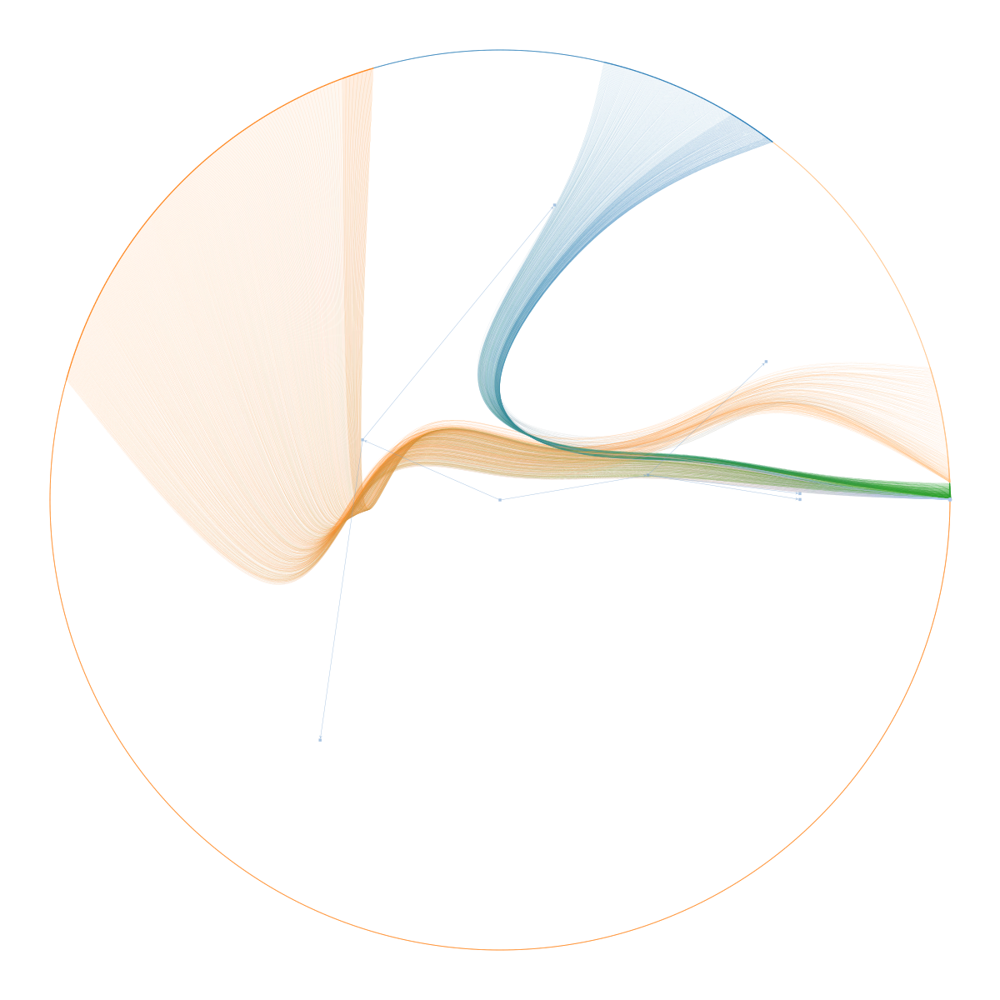

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2973ff350, at 0x296772610>,
 <GraphView object, directed, with 3854 vertices and 3853 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x297c4f650, at 0x297983f10>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x297c4f650, at 0x297c4e490>, False), at 0x297c4f650>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x297c4f650, at 0x297c5acd0>)

In [103]:
state.draw(subsample_edges=1000)

In [26]:
# To visualize the communities, you can color the vertices according to their community at a chosen level
g.vertex_properties["community"] = levels[0].get_blocks()
gt.graph_draw(g, vertex_fill_color=g.vertex_properties["community"], output=figure_path+"nested_color_0.pdf")

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x296777010, at 0x298b9ac10>

In [27]:
# Create a new vertex property map based on g
community = g.new_vertex_property("int")

# Copy the community assignments from levels[1] to the new property map
for v in g.iter_vertices():
    community[v] = levels[1].get_blocks()[v]

# Use the new property map for visualization
gt.graph_draw(g, vertex_fill_color=community, output=figure_path+"nested_color_1.pdf")


<VertexPropertyMap object with value type 'vector<double>', for Graph 0x296777010, at 0x298b9a0d0>

In [28]:
# Create a new vertex property map based on g
community = g.new_vertex_property("int")

# Copy the community assignments from levels[1] to the new property map
for v in g.iter_vertices():
    community[v] = levels[2].get_blocks()[v]

# Use the new property map for visualization
gt.graph_draw(g, vertex_fill_color=community, output=figure_path+"nested_color_2.pdf")

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x296777010, at 0x298d02250>

# hSBM fit()

In [218]:
from sbm_multilayer_new import *
SEED_NUM = 32
city_bank_user_sbm = sbmmultilayer(random_seed=SEED_NUM, n_init=6)
city_bank_user_sbm.g = g
city_bank_user_sbm.fit()
current_path = figure_path+"multilayer_cd_text.png"
city_bank_user_sbm.state.draw(output=current_path, output_size=(10000, 10000), vertex_font_size=10, vertex_text=node_text)


(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2f9fd5190>,
 <GraphView object, directed, with 4035 vertices and 4034 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2f46524d0, at 0x2f9feef10>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2f46524d0, at 0x2f9feecd0>, False), at 0x2f46524d0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2f46524d0, at 0x2f46525d0>)

In [219]:
current_path = figure_path+"multilayer_cd_text_small.png"
city_bank_user_sbm.state.draw(output=current_path, vertex_font_size=1, vertex_text=node_text)

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2f9f35950>,
 <GraphView object, directed, with 4035 vertices and 4034 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2f4652dd0, at 0x2f9f37990>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2f4652dd0, at 0x2f46ec650>, False), at 0x2f4652dd0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2f4652dd0, at 0x2f9fd6cd0>)

In [249]:
# current_path = figure_path+"multilayer_cd_text_bipartite_large.png"
# city_bank_user_sbm.state.draw(output=current_path, layout="bipartite", output_size=(10000, 10000), vertex_font_size=10, vertex_text=node_text)
partition = city_bank_user_sbm.g.new_vertex_property("int")
for v in city_bank_user_sbm.g.vertices():
    if city_bank_user_sbm.g.vp.kind[v] == 0:
        partition[v] = 1
    else:
        partition[v] = 0

# for v in city_bank_user_sbm.g.vertices():
#     print(type(partition[v]))

current_path = figure_path+"multilayer_cd_text_bipartite.png"
# city_bank_user_sbm.state.draw(output=current_path, layout="bipartite", vertex_font_size=1, vertex_text=node_text)
city_bank_user_sbm.state.draw(output=current_path, layout="bipartite", vertex_font_size=1, vertex_text=node_text, partition=partition)

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2fa7802d0>,
 <GraphView object, directed, with 4035 vertices and 4034 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2fa875450, at 0x2fa8777d0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2fa875450, at 0x2fa876050>, False), at 0x2fa875450>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2fa875450, at 0x297c3c710>)

/Users/jiashichao/anaconda3/envs/newgt/lib/python3.11/site-packages/graph_tool/draw/cairo_draw.py:668: UserWarning: Unknown parameter: partition
  warnings.warn("Unknown parameter: " + k, UserWarning)


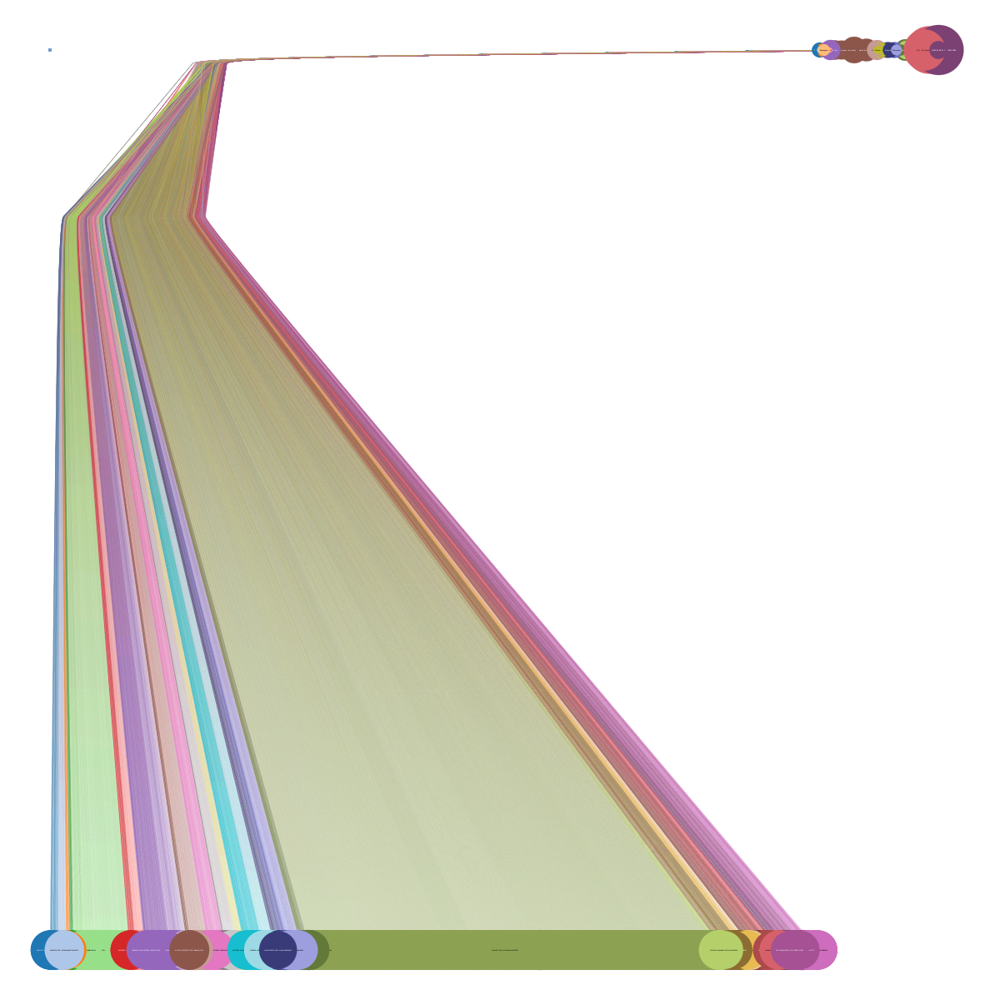

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2f9f34350>,
 <GraphView object, directed, with 4035 vertices and 4034 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2fa8a0dd0, at 0x2f9fac690>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2fa8a0dd0, at 0x2f9faf650>, False), at 0x2fa8a0dd0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2fa8a0dd0, at 0x2f46f55d0>)

In [259]:
# Step 1: Create a new vertex property for positions
pos = city_bank_user_sbm.g.new_vertex_property("vector<float>")

# Get the levels of the hierarchy
levels = city_bank_user_sbm.state.get_levels()
# Get block labels for each vertex
clusters = levels[0].get_blocks()

# Step 1: Get all the 'id' nodes and other nodes
id_nodes = [v for v in city_bank_user_sbm.g.vertices() if city_bank_user_sbm.g.vp.kind[v] == 0]
other_nodes = [v for v in city_bank_user_sbm.g.vertices() if city_bank_user_sbm.g.vp.kind[v] != 0]

# Step 2: Sort nodes by their clusters
id_nodes.sort(key=lambda v: (clusters[v], v))
other_nodes.sort(key=lambda v: (clusters[v], v))

# Step 2: Assign positions based on the 'kind' attribute
width = 1.0 / city_bank_user_sbm.g.num_vertices()
for idx, v in enumerate(id_nodes + other_nodes):
    x = width * idx
    y = 1 if city_bank_user_sbm.g.vp.kind[v] == 0 else 0
    pos[v] = (x, y)
city_bank_user_sbm.state.draw(layout=pos, vertex_font_size=1, vertex_text=node_text, partition=partition)

In [252]:
current_path = figure_path+"multilayer_cd_text_bipartite_custom.png"
city_bank_user_sbm.state.draw(output=current_path, layout=pos, output_size=(10000, 10000), vertex_font_size=10, vertex_text=node_text, partition=partition)

/Users/jiashichao/anaconda3/envs/newgt/lib/python3.11/site-packages/graph_tool/draw/cairo_draw.py:668: UserWarning: Unknown parameter: partition
  warnings.warn("Unknown parameter: " + k, UserWarning)


(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2fa9285d0>,
 <GraphView object, directed, with 4035 vertices and 4034 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2faa00a50, at 0x2fa8c6450>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2faa00a50, at 0x2fa8c5d50>, False), at 0x2faa00a50>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2faa00a50, at 0x2fa969050>)

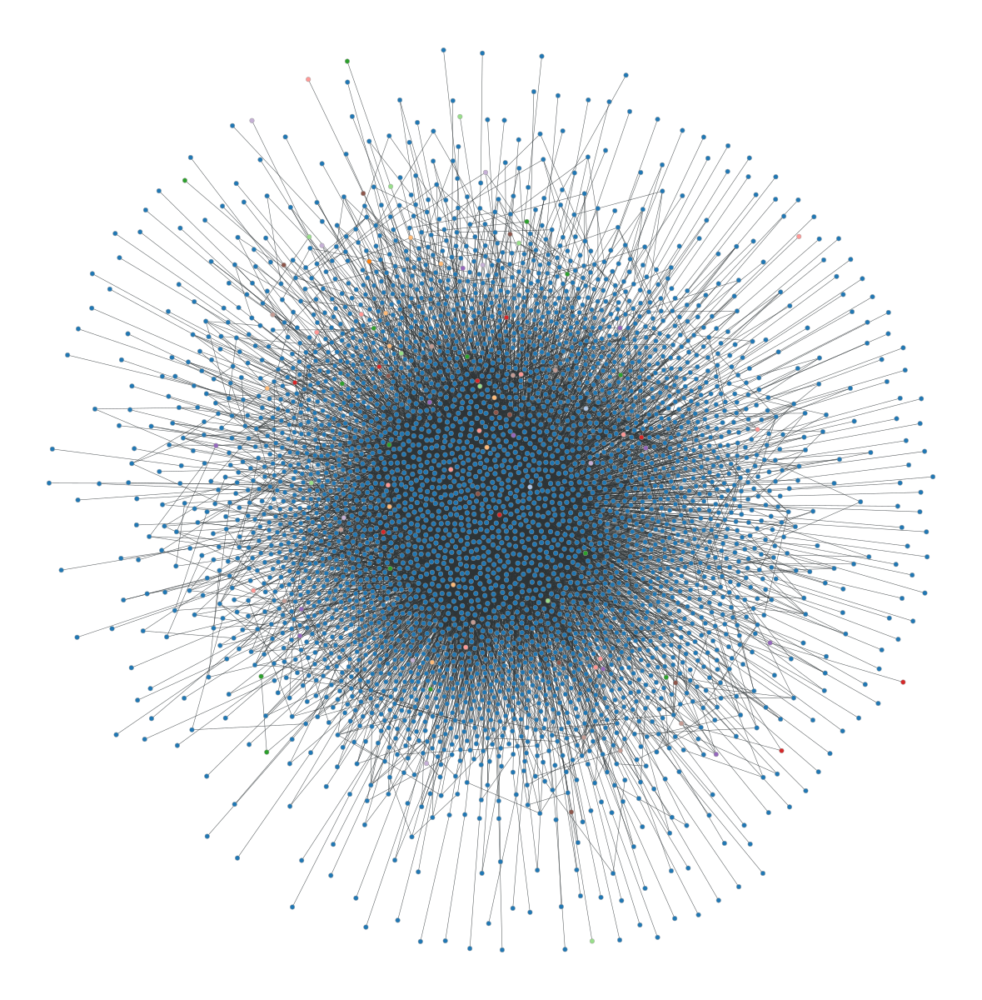

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2f9f3e850>

In [226]:
# Create a new vertex property map based on g
community = city_bank_user_sbm.g.new_vertex_property("int")

# Copy the community assignments from levels[1] to the new property map
for v in g.iter_vertices():
    community[v] = levels[2].get_blocks()[v]

# Use the new property map for visualization
gt.graph_draw(city_bank_user_sbm.g, vertex_fill_color=community)

In [220]:
# Get the levels of the hierarchy
levels = city_bank_user_sbm.state.get_levels()

# Print the number of communities at each level
for i, s in enumerate(levels):
    print(f"Level {i}: {len(set(s.get_blocks()))} communities")

# # You can also print the community of each vertex at each level
# for v in g.iter_vertices():
#     communities = [s.get_blocks()[v] for s in levels]
#     print(f"Vertex {v} is in communities {communities}")
for v in g.iter_vertices():
    if vertex_names[v] == "London":
        communities = [s.get_blocks()[v] for s in levels]
        print(f"Vertex {v} is in communities {communities}")
    elif vertex_names[v] == "HSBC BANK PLC":
        communities = [s.get_blocks()[v] for s in levels]
        print(f"Vertex {v} is in communities {communities}")

Level 0: 114 communities
Level 1: 32 communities
Level 2: 12 communities
Level 3: 6 communities
Level 4: 3 communities
Level 5: 3 communities
Level 6: 3 communities
Level 7: 3 communities
Level 8: 3 communities
Level 9: 3 communities
Level 10: 3 communities
Level 11: 3 communities
Level 12: 3 communities
Vertex 6 is in communities [1573, 78, 6, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 3817 is in communities [3510, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


In [222]:
# Get block labels for each vertex
blocks = levels[1].get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(vertex_names[v])

community_num_list = []

# Print out the vertices for each community
for block, vertices in community_dict.items():
    print(f"Community {block}:")
    vertex_list = ", ".join([str(v) for v in vertices])
    print(vertex_list)
    community_num_list.append(len(vertex_list.split(',')))
    print(f"Total Nodes in this Community is: {len(vertex_list.split(','))}")
    print(f"Total Nodes in Whole Network: {len(g.get_vertices())}")
    print("----------------------")

Community 78:
ce3d4f74-f5ea-4d78-8ba8-ceca45235edb, Slough, London, 40145ab5-241c-47c5-bb6a-3a05374b28a9, 8d815932-5a40-41b8-bc6c-43ce7c107cad, 04fab601-e007-4f97-ab81-adc599b0e6a0, 42e9556d-ca43-4dc3-8bbd-53ad615a549f, e53e257f-6d4e-4a1a-a843-a38ebb0a2a51, 0c170e1f-78ee-4ff8-9e28-eeac2f23fcd9, 79962ef4-cac1-42e1-b5a6-47b84c6d074a, Swanscombe, 2e2daa14-35df-473e-aec2-f7f2dfa1a91b, Upminster, Leigh, a926714a-3061-4fe5-a890-c96c302b4dff, 92ad7afd-9560-4170-ab20-5b6441e2c30c, c876b1d0-41ed-4e9e-abdf-bedaf7217a56, Brackley, 6b100203-4158-48d6-a9e5-1eab1b15f550, Sale, 52f3bc82-5073-4131-a0be-f7424acb4b9d, 14308576-ee95-4280-bfd8-e180a9e192d5, brighton, f1ac0e27-5380-41cb-909f-21009866e0eb, 102fe4ad-90bd-41f6-94b0-be943a10fd6d, d9023abd-196e-4428-8e9c-cbb1a188afd6, 6a733c33-7cbf-43cf-adff-c79006389c5c, 94c5f872-1a50-40b6-9112-4ebf602c36a4, 81939303-2a0d-4789-9789-1f994751d656, ac2611d4-4944-45c7-a816-83550eba5db1, b7dd4984-05c4-4b1f-b167-f2061f8d016c, 37e85f61-6354-4440-9f8f-269b19ab6766, Ca

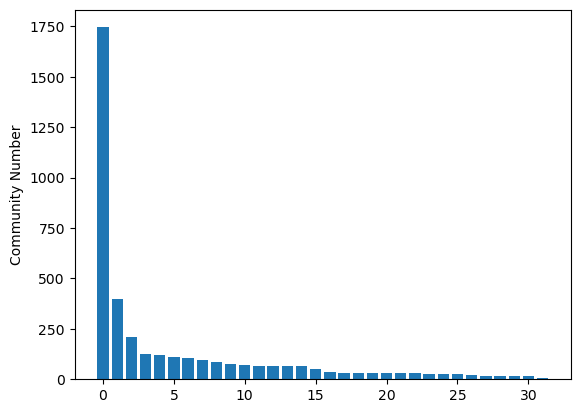

32


In [223]:
# 对列表进行从大到小的排序
lst_sorted = sorted(community_num_list, reverse=True)

# 绘制柱状图
plt.bar(range(len(lst_sorted)), lst_sorted)
plt.ylabel('Community Number')
plt.show()
print(len(lst_sorted))

In [224]:
# Get block labels for each vertex
blocks = levels[1].get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(vertex_names[v])

community_num_list = []

# Print out the vertices for each community
for block, vertices in community_dict.items():
    vertex_list = ", ".join([str(v) for v in vertices])
    if "London" in vertex_list:
        print(f"Community {block}:")
        print(vertex_list)
        community_num_list.append(len(vertex_list.split(',')))
        print(f"Total Nodes in this Community is: {len(vertex_list.split(','))}")
        print(f"Total Nodes in Whole Network: {len(g.get_vertices())}")
        print("----------------------")

Community 78:
ce3d4f74-f5ea-4d78-8ba8-ceca45235edb, Slough, London, 40145ab5-241c-47c5-bb6a-3a05374b28a9, 8d815932-5a40-41b8-bc6c-43ce7c107cad, 04fab601-e007-4f97-ab81-adc599b0e6a0, 42e9556d-ca43-4dc3-8bbd-53ad615a549f, e53e257f-6d4e-4a1a-a843-a38ebb0a2a51, 0c170e1f-78ee-4ff8-9e28-eeac2f23fcd9, 79962ef4-cac1-42e1-b5a6-47b84c6d074a, Swanscombe, 2e2daa14-35df-473e-aec2-f7f2dfa1a91b, Upminster, Leigh, a926714a-3061-4fe5-a890-c96c302b4dff, 92ad7afd-9560-4170-ab20-5b6441e2c30c, c876b1d0-41ed-4e9e-abdf-bedaf7217a56, Brackley, 6b100203-4158-48d6-a9e5-1eab1b15f550, Sale, 52f3bc82-5073-4131-a0be-f7424acb4b9d, 14308576-ee95-4280-bfd8-e180a9e192d5, brighton, f1ac0e27-5380-41cb-909f-21009866e0eb, 102fe4ad-90bd-41f6-94b0-be943a10fd6d, d9023abd-196e-4428-8e9c-cbb1a188afd6, 6a733c33-7cbf-43cf-adff-c79006389c5c, 94c5f872-1a50-40b6-9112-4ebf602c36a4, 81939303-2a0d-4789-9789-1f994751d656, ac2611d4-4944-45c7-a816-83550eba5db1, b7dd4984-05c4-4b1f-b167-f2061f8d016c, 37e85f61-6354-4440-9f8f-269b19ab6766, Ca

In [175]:
# Get block labels for each vertex
blocks = levels[0].get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(vertex_names[v])

# Print out the vertices for each community
for block, vertices in community_dict.items():
    vertex_list = ", ".join([str(v) for v in vertices])
    size = len(vertex_list.split(','))
    if size <= 1: 
        print(f"Community {block}:")
        print(vertex_list)
        print(f"Total Nodes in this Community is: {size}")
        print(f"Total Nodes in Whole Network: {len(g.get_vertices())}")
        print("----------------------")

Community 3056:
Leicester
Total Nodes in this Community is: 1
Total Nodes in Whole Network: 3846
----------------------
Community 144:
Coventry
Total Nodes in this Community is: 1
Total Nodes in Whole Network: 3846
----------------------
Community 2290:
Manchester
Total Nodes in this Community is: 1
Total Nodes in Whole Network: 3846
----------------------
Community 2597:
34f30c26-4ab6-4b64-94f2-ccdf4cd0b1c1
Total Nodes in this Community is: 1
Total Nodes in Whole Network: 3846
----------------------
Community 3068:
Trimdon Station
Total Nodes in this Community is: 1
Total Nodes in Whole Network: 3846
----------------------


In [225]:
# Get block labels for each vertex
blocks = levels[0].get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(v)

# For each Community: 
for block, vertices in community_dict.items():
    csv_dict = {}
    # Node, Node name, Node type, Node layer
    for v in vertices:
        l = vertex_layer[v]
        t = vertex_types[v]
        n = vertex_names[v]
        if t != 0:
            current_dict = {'name':n, 'type':t, 'layer':l}
            csv_dict[v] = current_dict
    df = pd.DataFrame(csv_dict)
    df.to_csv(f"/Users/jiashichao/Desktop/Edinburgh/valerio_project/evaluation_figures/community_detail/community{block}_{len(csv_dict)}.csv")



In [232]:
# check level 1
# Get block labels for each vertex
blocks = levels[1].get_blocks().a

# Create a dictionary to store vertices for each community

csv_dict = {}
# Copy the community assignments from levels[1] to the new property map
for v in g.iter_vertices():
    n = vertex_names[v]
    l = vertex_layer[v]
    t = vertex_types[v]
    b = levels[1].get_blocks()[v]
    if t != 0:
        current_dict = {'name':n, 'type':t, 'layer':l, 'blocks':b}
        csv_dict[v] = current_dict
df = pd.DataFrame(csv_dict)
df.to_csv(f"/Users/jiashichao/Desktop/Edinburgh/valerio_project/evaluation_figures/level_1.csv")

In [230]:
# check level 2
# Get block labels for each vertex
blocks = levels[2].get_blocks().a

# Create a dictionary to store vertices for each community

csv_dict = {}
# Copy the community assignments from levels[1] to the new property map
for v in g.iter_vertices():
    n = vertex_names[v]
    l = vertex_layer[v]
    t = vertex_types[v]
    b = levels[2].get_blocks()[v]
    if t != 0:
        current_dict = {'name':n, 'type':t, 'layer':l, 'blocks':b}
        csv_dict[v] = current_dict
df = pd.DataFrame(csv_dict)
df.to_csv(f"/Users/jiashichao/Desktop/Edinburgh/valerio_project/evaluation_figures/level_2.csv")

In [231]:
# check level 3
# Get block labels for each vertex
blocks = levels[3].get_blocks().a

# Create a dictionary to store vertices for each community

csv_dict = {}
# Copy the community assignments from levels[1] to the new property map
for v in g.iter_vertices():
    n = vertex_names[v]
    l = vertex_layer[v]
    t = vertex_types[v]
    b = levels[3].get_blocks()[v]
    if t != 0:
        current_dict = {'name':n, 'type':t, 'layer':l, 'blocks':b}
        csv_dict[v] = current_dict
df = pd.DataFrame(csv_dict)
df.to_csv(f"/Users/jiashichao/Desktop/Edinburgh/valerio_project/evaluation_figures/level_3.csv")

# 中心性度量

In [29]:
# Calculate degree centrality
degree_centrality = g.degree_property_map("total")

max_degree_centrality = 0

# Print the degree centrality of each vertex
for v in g.iter_vertices():
    if max_degree_centrality < degree_centrality[v]:
        max_degree_centrality = degree_centrality[v]
        max_degree_centrality_node = v
    # print(f"Vertex {v} has degree centrality {degree_centrality[v]}")
print(f"Vertex {max_degree_centrality_node} has max degree centrality {max_degree_centrality}")

Vertex 3817 has max degree centrality 2188


# 网络直径和平均路径长度

In [30]:
# Calculate the shortest paths from each vertex to all others
dist_map = gt.shortest_distance(g)

# The maximum of these distances is the diameter of the graph
diameter = max(max(distances) for distances in dist_map)

# The average path length is the average of these distances
average_path_length = sum(sum(distances) for distances in dist_map) / (g.num_vertices() * (g.num_vertices() - 1))

print(f"Diameter: {diameter}")
print(f"Average path length: {average_path_length}")

Diameter: 8
Average path length: 3.137746680218314


# 聚类系数
一个全局聚类系数为0的网络意味着网络中的三元组（三个节点，其中两个节点与第三个节点相连）几乎没有闭环（也就是说，这三个节点之间没有形成完全连接的三角形）。在您的网络中，这可能是因为您的网络是一个二部图，其中ID节点连接到bank节点和city节点，但bank节点和city节点之间没有直接的连接。在这种情况下，网络中的三元组无法形成闭环，因此聚类系数为0。

聚类系数通常用于度量网络的聚类程度，也就是节点的邻居之间连接得有多紧密。在社交网络中，如果Alice是Bob的朋友，Bob是Charlie的朋友，那么Alice和Charlie也有可能是朋友，这就形成了一个闭环。但在您的网络中，如果一个ID节点连接到一个bank节点和一个city节点，这并不意味着这个bank节点和这个city节点也有连接，所以网络的聚类系数为0。

这是一个有趣的观察结果，因为它揭示了您的网络的一个重要特性。当然，为了深入理解网络的结构和动态，可能还需要进行更多的分析。

In [31]:
# Calculate the local clustering coefficient for each vertex
local_clustering = gt.local_clustering(g)

# The global clustering coefficient is the average of these
global_clustering = local_clustering.fa.mean()

print(f"Global clustering coefficient: {global_clustering}")

Global clustering coefficient: 0.0


# 介数中心性
介数中心性是一种衡量节点在网络中的重要性的度量，它考虑的是该节点在网络中所有节点对之间最短路径上出现的次数。对于大型网络，计算全局的介数中心性可能非常耗时，一种可能的解决方案是计算近似的介数中心性。

In [32]:
# Calculate the approximate betweenness centrality for each vertex
vertex_betweenness = gt.betweenness(g)[0]

# Print the betweenness centrality of each vertex
for v in g.iter_vertices():
    print(f"Vertex {v} has betweenness centrality {vertex_betweenness[v]}")

Vertex 0 has betweenness centrality 3.829357988353647e-05
Vertex 1 has betweenness centrality 6.10231311372817e-05
Vertex 2 has betweenness centrality 0.0002600087023634246
Vertex 3 has betweenness centrality 1.820851981049355e-05
Vertex 4 has betweenness centrality 0.0002600087023634246
Vertex 5 has betweenness centrality 4.1340559664562416e-05
Vertex 6 has betweenness centrality 0.10954738026981363
Vertex 7 has betweenness centrality 0.0007399233055597202
Vertex 8 has betweenness centrality 8.540429277814213e-07
Vertex 9 has betweenness centrality 0.0005201560468140449
Vertex 10 has betweenness centrality 0.0
Vertex 11 has betweenness centrality 0.00018252963474377253
Vertex 12 has betweenness centrality 7.560229519747792e-05
Vertex 13 has betweenness centrality 0.001050150815894358
Vertex 14 has betweenness centrality 9.214520851461213e-05
Vertex 15 has betweenness centrality 0.0007135341063037545
Vertex 16 has betweenness centrality 0.0005201560468140438
Vertex 17 has betweenness c

# PageRank
PageRank是一种流行的节点排名算法，最初由Google的创始人用来对网页进行排名。PageRank将节点视为网络中的随机“浏览者”，并测量在随机游走过程中到达每个节点的概率。

In [33]:
# Calculate the PageRank of each vertex
pagerank = gt.pagerank(g)

max_pagerank = 0

# Print the PageRank of each vertex
for v in g.iter_vertices():
    if max_pagerank < pagerank[v]:
        max_pagerank = pagerank[v]
        max_pagerank_node = v
    # print(f"Vertex {v} has PageRank {pagerank[v]}")
print(f"Vertex {max_pagerank_node} has Max PageRank {max_pagerank}")

Vertex 3817 has Max PageRank 0.11505880391636779


# 社区结构可视化

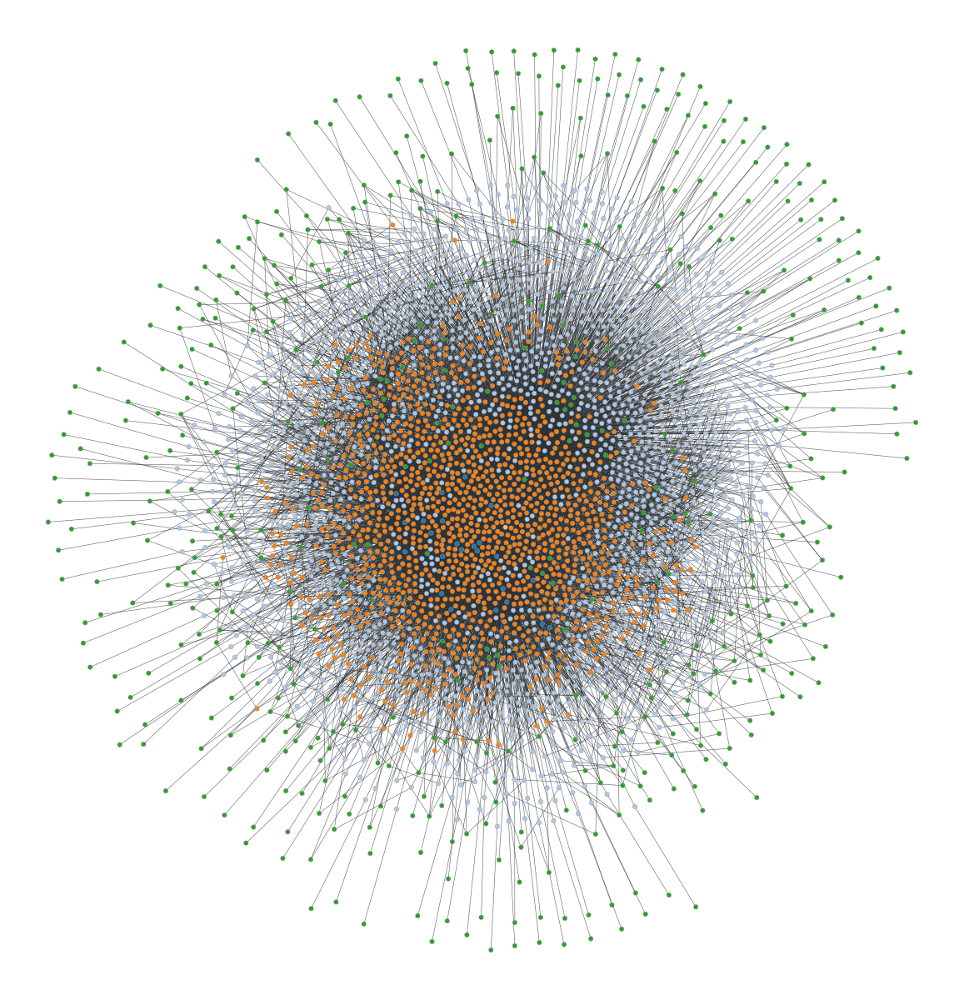

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x296777010, at 0x298d00850>

In [34]:
# Assume you have already calculated the community structure and saved it as a vertex property 'community'
community = g.vertex_properties['community']

# Draw the graph
pos = gt.sfdp_layout(g)  # Use the SFDP algorithm to layout the graph
gt.graph_draw(g, pos, vertex_fill_color=community)

# Entropy
这个函数计算的是SBM的描述长度（description length），这是一个衡量模型复杂度和模型拟合数据好坏之间权衡的度量。在SBM中，更好的社区划分会有更低的描述长度。

In [35]:
# Calculate the description length
dl = state.entropy()

print(f"Description length: {dl}")

Description length: 35173.170786133946


# from City to Bank
1. 对于每个City节点，找出它的所有邻居节点（即通过边直接连接的节点，这应该都是ID节点）。
2. 对于每个这样的ID节点，找出它的所有邻居节点（这应该都是bank节点）。
3. 统计每个City节点与每个bank节点之间的共享ID节点的数量。这个数量可以作为City和bank之间关联强度的度量。

In [36]:
import graph_tool.all as gt
from collections import defaultdict

# Load the graph
g = gt.load_graph("multilayer_network_graph.gt")

# Get the vertex types
vertex_types = g.vertex_properties["kind"]

# Create a dictionary to store the association strength between each city and each bank
association_strength = defaultdict(lambda: defaultdict(int))

# For each city vertex
for v in g.iter_vertices():
    if vertex_types[v] != 2:
        continue

    # For each ID neighbor of the city
    for w in g.vertex(v).all_neighbors():
        if vertex_types[w] != 0:
            continue

        # For each bank neighbor of the ID
        for u in g.vertex(w).all_neighbors():
            if vertex_types[u] != 1:
                continue

            # Increment the association strength between the city and the bank
            association_strength[v][u] += 1

# Print the association strength between each city and each bank
for v, banks in association_strength.items():
    for u, strength in banks.items():
        print(f"City {v} and bank {u} have association strength {strength}")

print(association_strength.items())


City 1 and bank 3814 have association strength 3
City 1 and bank 3815 have association strength 2
City 1 and bank 3830 have association strength 7
City 1 and bank 3816 have association strength 3
City 1 and bank 3817 have association strength 6
City 1 and bank 3825 have association strength 1
City 1 and bank 3827 have association strength 1
City 3 and bank 3816 have association strength 2
City 3 and bank 3817 have association strength 5
City 3 and bank 3818 have association strength 1
City 3 and bank 3815 have association strength 1
City 3 and bank 3823 have association strength 1
City 3 and bank 3821 have association strength 1
City 6 and bank 3818 have association strength 89
City 6 and bank 3817 have association strength 588
City 6 and bank 3823 have association strength 58
City 6 and bank 3824 have association strength 1
City 6 and bank 3814 have association strength 60
City 6 and bank 3815 have association strength 51
City 6 and bank 3827 have association strength 167
City 6 and b

In [37]:
# Find the city and bank with the maximum association strength
max_strength = 0
max_city = None
max_bank = None
for v, banks in association_strength.items():
    for u, strength in banks.items():
        if strength > max_strength:
            max_strength = strength
            max_city = v
            max_bank = u

print(f"City {max_city} and bank {max_bank} have maximum association strength {max_strength}")

City 6 and bank 3817 have maximum association strength 588


分析 bank 和 City 之间的联系主要依赖于它们共享的 ID 节点，而并未直接使用到社区检测的结果。这种方法主要是基于网络的拓扑结构进行的。

然而，社区检测在某些情况下仍然可能对分析有帮助。例如，如果我们发现某个社区中的 ID 节点主要连接到特定的 bank 和 City，那么这个社区可能就代表了 bank 和 City 之间的特定关系。另一个可能的应用是，我们可以使用社区检测的结果作为我们分析的起点，例如，我们可以先对整个网络进行社区检测，然后在每个社区内部分析 bank 和 City 之间的联系。

总的来说，是否使用社区检测以及如何使用社区检测，取决于您的具体问题和数据。在某些情况下，直接分析网络的拓扑结构可能就足够了，而在其他情况下，社区检测可能会提供额外的洞见。

# 循环中对网络中的每个社区内部分析bank和City之间的联系

In [38]:
# Load the graph
g = gt.load_graph("multilayer_network_graph.gt")

# Get the vertex types
vertex_types = g.vertex_properties["kind"]

# Perform community detection
state = gt.minimize_blockmodel_dl(g)
communities = state.get_blocks()

# For each community
for c in set(communities.a):
    # Create a dictionary to store the association strength between each city and each bank within this community
    association_strength = defaultdict(lambda: defaultdict(int))

    # For each city vertex in this community
    for v in g.iter_vertices():
        if communities[v] != c or vertex_types[v] != 2:
            continue

        # For each ID neighbor of the city
        for w in g.vertex(v).all_neighbors():
            if vertex_types[w] != 0:
                continue

            # For each bank neighbor of the ID
            for u in g.vertex(w).all_neighbors():
                if vertex_types[u] != 1:
                    continue

                # Increment the association strength between the city and the bank
                association_strength[v][u] += 1

    # Find the city and bank with the maximum association strength within this community
    max_strength = 0
    max_city = None
    max_bank = None
    for v, banks in association_strength.items():
        for u, strength in banks.items():
            if strength > max_strength:
                max_strength = strength
                max_city = v
                max_bank = u

    print(f"In community {c}, city {max_city} and bank {max_bank} have maximum association strength {max_strength}")


In community 0, city 6 and bank 3817 have maximum association strength 588


In [39]:
# Load the graph
g = gt.load_graph("multilayer_network_graph.gt")

# Get the vertex types
vertex_types = g.vertex_properties["kind"]

# Perform community detection
state = gt.minimize_nested_blockmodel_dl(g)
levels = state.get_levels()

# For each level
for i, level in enumerate(levels):
    # Get the communities at this level
    communities = level.get_blocks()

    # For each community at this level
    for c in set(communities.a):
        # Create a dictionary to store the association strength between each city and each bank within this community
        association_strength = defaultdict(lambda: defaultdict(int))

        # For each city vertex in this community
        for v in g.iter_vertices():
            if communities[v] != c or vertex_types[v] != 2:
                continue

            # For each ID neighbor of the city
            for w in g.vertex(v).all_neighbors():
                if vertex_types[w] != 0:
                    continue

                # For each bank neighbor of the ID
                for u in g.vertex(w).all_neighbors():
                    if vertex_types[u] != 1:
                        continue

                    # Increment the association strength between the city and the bank
                    association_strength[v][u] += 1

        # Find the city and bank with the maximum association strength within this community
        max_strength = 0
        max_city = None
        max_bank = None
        for v, banks in association_strength.items():
            for u, strength in banks.items():
                if strength > max_strength:
                    max_strength = strength
                    max_city = v
                    max_bank = u

        print(f"At level {i}, in community {c}, city {max_city} and bank {max_bank} have maximum association strength {max_strength}")


At level 0, in community 33, city None and bank None have maximum association strength 0
At level 0, in community 260, city None and bank None have maximum association strength 0
At level 0, in community 3691, city 167 and bank 3817 have maximum association strength 107
At level 0, in community 3407, city None and bank None have maximum association strength 0
At level 0, in community 438, city None and bank None have maximum association strength 0
At level 0, in community 3354, city 6 and bank 3817 have maximum association strength 588
At level 0, in community 1244, city None and bank None have maximum association strength 0
At level 1, in community 1, city 15 and bank 3817 have maximum association strength 34
At level 1, in community 2, city 6 and bank 3817 have maximum association strength 588
At level 2, in community 0, city 6 and bank 3817 have maximum association strength 588
At level 3, in community 0, city 6 and bank 3817 have maximum association strength 588
At level 4, in comm

In [40]:
import csv
# Prepare a list to store the results
results = []

# Get the vertex names
vertex_names = g.vertex_properties["name"]

# For each level
for i, level in enumerate(levels):
    # Get the communities at this level
    communities = level.get_blocks()

    # For each community at this level
    for c in set(communities.a):
        # Create a dictionary to store the association strength between each city and each bank within this community
        association_strength = defaultdict(lambda: defaultdict(int))

        # For each city vertex in this community
        for v in g.iter_vertices():
            if communities[v] != c or vertex_types[v] != 2:
                continue

            # For each ID neighbor of the city
            for w in g.vertex(v).all_neighbors():
                if vertex_types[w] != 0:
                    continue

                # For each bank neighbor of the ID
                for u in g.vertex(w).all_neighbors():
                    if vertex_types[u] != 1:
                        continue

                    # Increment the association strength between the city and the bank
                    association_strength[v][u] += 1

        # Sort the association strengths and get the top pairs
        sorted_strengths = sorted([(v, u, s) for v, banks in association_strength.items() for u, s in banks.items()], key=lambda x: -x[2])
        top_pairs = sorted_strengths[:5]  # get the top 5 pairs, you can adjust this number as needed

        for v, u, strength in top_pairs:
            results.append({"level": i, "community": c, "city": vertex_names[v], "bank": vertex_names[u], "strength": strength})

# Write the results to a CSV file
with open("/Users/jiashichao/Desktop/Edinburgh/valerio_project/data/strong_associations.csv", "w", newline="") as f:
    writer = csv.DictWriter(f, fieldnames=["level", "community", "city", "bank", "strength"])
    writer.writeheader()
    for row in results:
        writer.writerow(row)

print("Strong associations written to strong_associations.csv")


Strong associations written to strong_associations.csv


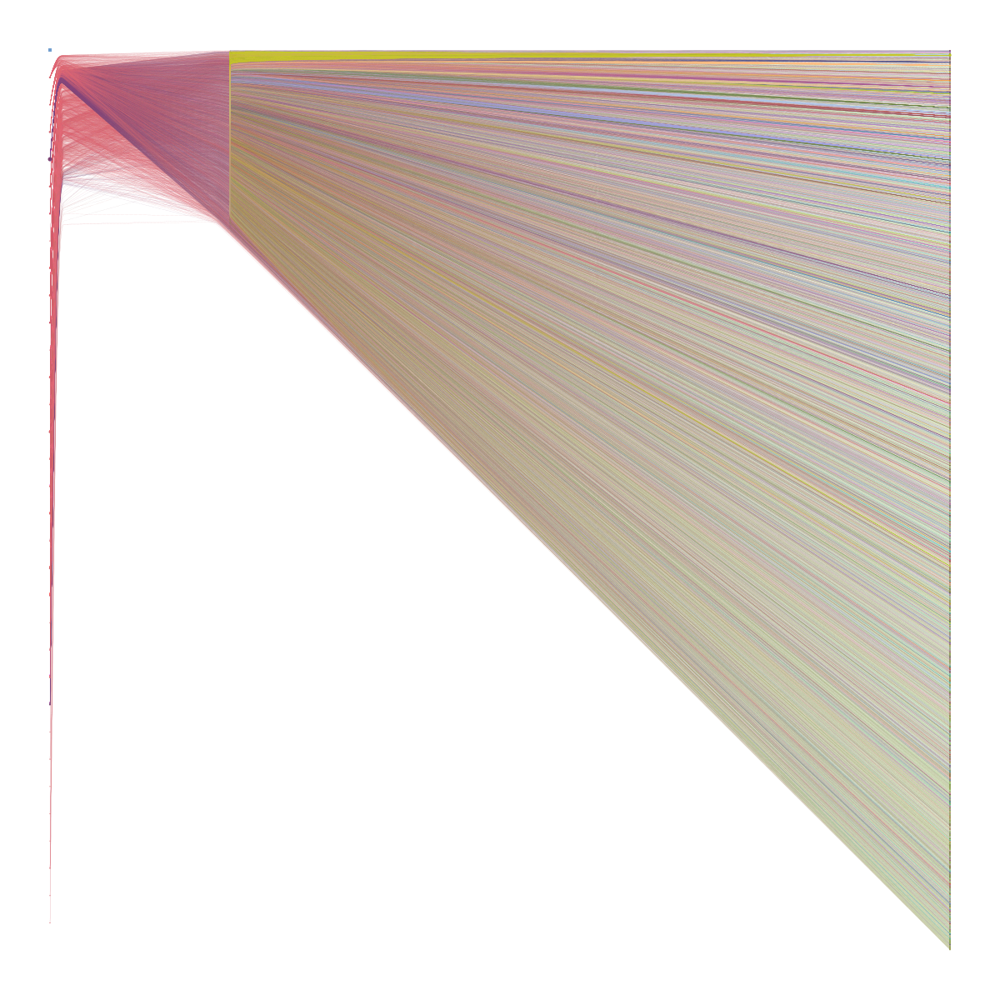

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x2fa77bd90>,
 <GraphView object, directed, with 4035 vertices and 4034 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x2fa928690, at 0x2fa9fc110>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x2fa928690, at 0x2fa9ff190>, False), at 0x2fa928690>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x2fa928690, at 0x2faa005d0>)

In [255]:
import numpy as np

# Create a property map for the vertex positions
pos = g.new_vertex_property("vector<double>")
vertex_types = g.vertex_properties["kind"]

# Assign x coordinates based on vertex type
for v in g.iter_vertices():
    if vertex_types[v] == 1:
        pos[v] = [0, 0]
    else:
        pos[v] = [1, 0]

# Assign y coordinates
for vertex_type in [1, 0, 2]:
    vertices_of_type = [v for v in g.iter_vertices() if vertex_types[v] == vertex_type]
    # y_coords = np.linspace(0, 1, len(vertices_of_type))
    # 增加间距，避免重合
    y_coords = np.linspace(0, 1, len(vertices_of_type) + 2)[1:-1]
    for v, y in zip(vertices_of_type, y_coords):
        pos[v][1] = y

# blocks = levels[0].get_blocks().a
# unique_blocks = np.unique(blocks)
# color_map = plt.colormaps.get_cmap('tab20')
# block_colors = {block: color_map(i / len(unique_blocks)) for i, block in enumerate(unique_blocks)}
# vertex_colors = g.new_vertex_property("vector<double>")
# for v in g.iter_vertices():
#     vertex_colors[v] = block_colors[blocks[v]]

# # Draw using the custom layout
# state.draw(layout=pos,edge_slopes=None,  output="/Users/jiashichao/Desktop/Edinburgh/valerio_project/figures/custom_layout_with_communities.pdf")
# gt.graph_draw(g, pos=pos, vertex_fill_color=vertex_colors)

# blocks = levels[0].get_blocks().a
# unique_blocks = np.unique(blocks)
# color_map = plt.colormaps.get_cmap('tab20')
# block_colors = {block: color_map(i / len(unique_blocks)) for i, block in enumerate(unique_blocks)}

# edge_colors = g.new_edge_property("vector<double>")
# for e in g.edges():
#     source_block = blocks[int(e.source())]
#     target_block = blocks[int(e.target())]
    
#     # If both endpoints belong to the same community, use that community's color
#     if source_block == target_block:
#         edge_colors[e] = block_colors[source_block]
#     else:
#         # Otherwise, you can choose a default color, or blend the colors, etc.
#         edge_colors[e] = [0.5, 0.5, 0.5]  # This sets a gray color for edges between different communities

# Draw using the custom layout
# state.draw(layout=pos,edge_slopes=None,  output="/Users/jiashichao/Desktop/Edinburgh/valerio_project/figures/custom_layout_with_communities.pdf")
city_bank_user_sbm.state.draw(layout=pos,edge_slopes=None)
# gt.graph_draw(g, pos=pos, edge_color=edge_colors)


# K-Means聚类

In [108]:
from sklearn.cluster import KMeans
from scipy.sparse.linalg import eigsh

# Compute the Laplacian of the graph
L = gt.laplacian(g).todense()

# Compute the eigenvectors using scipy. We'll use the 10 smallest eigenvalues.
eigvals, eigvecs = eigsh(L, k=10, which="SM")

# Use k-means clustering on the embedding
k = 5  # Set the desired number of clusters
kmeans = KMeans(n_clusters=k)
clusters = kmeans.fit_predict(eigvecs)

# Create a vertex property to store the community assignments
community_vp = g.new_vertex_property("int")
for v, c in enumerate(clusters):
    community_vp[v] = c

# Store the community assignments in the graph
g.vertex_properties["community"] = community_vp

/Users/jiashichao/anaconda3/envs/newgt/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [110]:
from matplotlib import cm
# Generate layout
pos = gt.sfdp_layout(g)

# Create a colormap based on community assignments
colors = g.new_vertex_property("vector<float>")
colormap = cm.get_cmap('hsv', k)
for v in g.iter_vertices():
    colors[v] = colormap(community_vp[v] / (k-1))

# Draw the graph with node colors based on community
gt.graph_draw(g, pos=pos, vertex_fill_color=colors, output=figure_path+"kmeans_color.pdf")

/var/folders/kh/cg897ykn1c3cs5h7yvgr8ncw0000gn/T/ipykernel_56691/1660275971.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap('hsv', k)


<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2973ff350, at 0x297aa2110>

# Edge Weight

In [44]:
edge_counts = g.edge_properties["edgeCount"]
edge_counts_list = [edge_counts[e] for e in g.edges()]
print(len(edge_counts_list))
print(sum(edge_counts_list))

10002
13438


# nonparametric degree-corrected microcanonical SBM clustering

In [127]:
# Load your graph
g = gt.load_graph("multilayer_network_graph_new.gt")

# Initialize the state. The nested block state (degree-corrected) will be used here.
state = gt.NestedBlockState(g, deg_corr=True)

# Find the hierarchical block partition with the largest Bayesian posterior probability.
dS, nmoves, _ = state.multiflip_mcmc_sweep(niter=1000)

# At this point, 'state' contains the degree-corrected microcanonical SBM clustering result.

# Extract the top-level block partitioning
blocks = state.levels[0].get_blocks().a

# Optional: Visualizing the clustering
pos = gt.sfdp_layout(g)
gt.graph_draw(g, pos, vertex_fill_color=blocks, output=figure_path+"np_degree_corrected_color.png")


<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x297bb9850>

In [129]:
# Get the levels of the hierarchy
levels = state.get_levels()

# Print the number of communities at each level
for i, s in enumerate(levels):
    print(f"Level {i}: {len(set(s.get_blocks()))} communities")

# You can also print the community of each vertex at each level
for v in g.iter_vertices():
    communities = [s.get_blocks()[v] for s in levels]
    print(f"Vertex {v} is in communities {communities}")

Level 0: 3 communities
Level 1: 4 communities
Level 2: 3 communities
Level 3: 1 communities
Level 4: 2 communities
Level 5: 1 communities
Level 6: 2 communities
Level 7: 1 communities
Level 8: 1 communities
Level 9: 2 communities
Level 10: 1 communities
Level 11: 1 communities
Level 12: 1 communities
Vertex 0 is in communities [1882, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 1 is in communities [1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0]
Vertex 2 is in communities [1882, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 3 is in communities [1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 4 is in communities [1882, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 5 is in communities [1882, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 6 is in communities [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 7 is in communities [1882, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 8 is in communities [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 9 is in communities [1882, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Vertex 10 

In [131]:
# Get block labels for each vertex
blocks = levels[0].get_blocks().a

# Create a dictionary to store vertices for each community
community_dict = {}

for v in g.iter_vertices():
    block = blocks[v]
    if block not in community_dict:
        community_dict[block] = []
    community_dict[block].append(vertex_names[v])

# Print out the vertices for each community
for block, vertices in community_dict.items():
    print(f"Community {block}:")
    vertex_list = ", ".join([str(v) for v in vertices])
    print(vertex_list)
    print(f"Total Nodes in this Community is: {len(vertex_list.split(','))}")
    print(f"Total Nodes in Whole Network: {len(g.get_vertices())}")
    print("----------------------")

Community 1882:
ce3d4f74-f5ea-4d78-8ba8-ceca45235edb, ffcf3506-a7d8-48a0-ba54-d4d54d15ee78, 2aa2a980-470d-470a-8379-ec51e5036ee4, 749ca4ea-26cb-4163-83f1-f5a2fca3a16a, 3253926e-9c0d-4fd9-8248-eb7c2f457b99, c0cdb5dc-ac39-4265-b66a-51faf326aed8, 6dec603a-b53c-4ca2-8c00-88f120d926f8, 886926ad-2f76-4746-a7fc-ca1473c848a3, e7405ced-44e0-417e-8ab8-ee8b8e8c4695, 83e821ec-6421-41cd-ad77-7921d11aad4d, 4713364b-17cb-4e9a-ac84-3be210e697a7, 22c9479f-0bc5-4210-abbd-6fe60e831138, bcb82538-178f-40d4-9559-bc750247fb2a, 3c629f00-e63d-4a51-87b0-85e207ee56e1, 09de4854-67ae-46d1-9a06-b72d64ffaa32, 4b84916f-37ce-46ac-86eb-c2db2d45f8ac, 8c3b9ab4-f433-4ad7-a879-5d4e805fd1a9, a003a2d3-8379-4cab-82b2-3a4001fbc83f, bd0a63d4-657d-4863-9529-a0829cb8a2aa, 2e31a7e0-c83a-4f5d-a461-061ec98ba0a6, a5f736f3-cc3f-41da-a014-4920a1342ad6, 1e6f5537-16f2-4e50-82b3-c9806ed32994, f500ad81-912f-4770-bd1d-57b75decddfa, 84caeb81-d8be-45f9-8093-822b9fcfdcf0, 6921651e-69f1-4e83-b65c-99cdbf4a07bb, cb737080-1b02-43c5-9623-67da9f54a5

In [130]:
state.draw(output=figure_path+"np_degree_corrected_cd.png")

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d0ffc50, at 0x28d13ac10>,
 <GraphView object, directed, with 3854 vertices and 3853 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x28d13a650, at 0x28d12d790>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x28d13a650, at 0x28d12da10>, False), at 0x28d13a650>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x28d13a650, at 0x28d12cbd0>)

In [47]:
# Use the basic block model with degree correction
state = gt.BlockState(g, deg_corr=True)

# Perform the MCMC sweeps
dS, nmoves, _ = state.multiflip_mcmc_sweep(niter=1000)

# Get the blocks (community assignments)
blocks = state.get_blocks().a

# Visualizing the clustering
pos = gt.sfdp_layout(g)
gt.graph_draw(g, pos, vertex_fill_color=blocks, output=figure_path+"basic_degree_corrected_color.pdf")

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2973ff350, at 0x298be8dd0>

In [48]:
state.draw(output=figure_path+"basic_degree_corrected_cd.pdf")

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x2973ff350, at 0x297a2db90>